## Land Cover Classification Using Random Forest with Sentinel-2 Satellite Imagery

Land use classification involves categorizing how different types of land are utilized or managed, distinguishing between various surface types such as agricultural areas, forests, water bodies, and urban developments. This classification process is essential for understanding human-environment interactions and supports critical applications in urban planning, agricultural management, environmental protection, and resource conservation.
### Random Forest Classifier
Random Forest is an ensemble machine learning method that builds multiple decision trees and combines their predictions. It handles complex remote sensing data effectively and provides feature importance rankings.Random Forest is an ensemble machine learning algorithm that constructs multiple decision trees and aggregates their predictions to produce robust classification results. This method is particularly effective for remote sensing applications due to its ability to handle high-dimensional data, manage complex spectral patterns, and provide feature importance rankings that help identify the most informative spectral bands for classification.

![Sentinel_LU_classification](https://menvuthy.readthedocs.io/en/latest/_images/Content_Documentation_machine-learning_1-land_use_classification_with_random_forests_33_0.png)

### Objectives
* To perform supervised classification of land cover using Sentinel-2 satellite imagery
* To evaluate the impact of different class numbers on classification accuracy
* To determine classification accuracy using out-of-bag error estimation
* To analyze the effect of combined training data from multiple labelers

## Class Selection

Five land cover classes were selected for classification:

1. **Water Bodies (Class 1)**  
   - Rivers, lakes, and other water features

2. **Vegetation (Class 2)**  
   - Agricultural areas, forests, and green spaces

3. **Barren Land (Class 3)**  
   - Exposed soil, bare ground, and rocky surfaces

4. **Road Networks (Class 4)**  
   - Transportation infrastructure and paved surfaces

5. **Urban Areas (Class 5)**  
   - Built environment, settlements, and artificial surfaces


In [1]:
# Import necessary libraries
from typing import Dict, Iterable, Tuple
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, ListedColormap
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
    )
from sklearn.model_selection import train_test_split
import cv2
import os

#### Visualizing the image

In [2]:
def color_stretch(image, index, minmax=(0, 10000)):
    colors = image[:, :, index].astype(np.float64)

    max_val = minmax[1]
    min_val = minmax[0]

    # Enforce maximum and minimum values
    colors[colors[:, :, :] > max_val] = max_val
    colors[colors[:, :, :] < min_val] = min_val

    for b in range(colors.shape[2]):
        colors[:, :, b] = colors[:, :, b] * 1 / (max_val - min_val)
        
    return colors

def get_cmap(class_prediction):
    n = class_prediction.max()
    # Next setup a colormap for our map
    colors = dict((
        (0, (220, 220, 220, 255)),  # No data
        (1, (0, 0, 205, 255)),  # Water bodies
        (2, (26, 101, 42, 255)),  # Vegetation
        (3, (210, 180, 140, 255)),  # Barren
        (4, (105, 105, 105, 255)),  # Road
        (5, (220, 20, 60, 255))  # Urban
    ))
    # Put 0 - 255 as float 0 - 1
    for k in colors:
        v = colors[k]
        _v = [_v / 255.0 for _v in v]
        colors[k] = _v
        
    index_colors = [colors[key] if key in colors else 
                    (255, 255, 255, 0) for key in range(1, n + 1)]
    cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n)
    

    return cmap



(669, 725, 8)


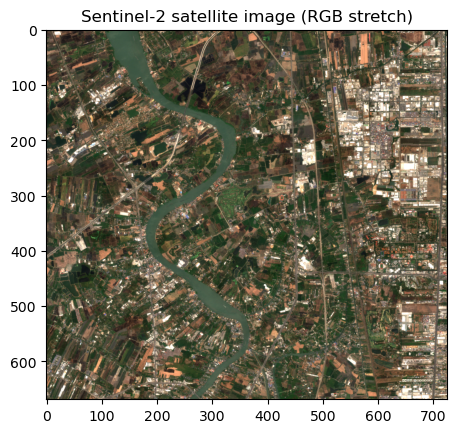

In [3]:
inp = np.load("data.npz")
img = inp['arr_0']  # Preserve the original multispectral cube
print(img.shape)

# Generate a stretched RGB view for context without modifying the raw data
vis_rgb = color_stretch(img, [3, 2, 1], (0, 0.3))
plt.imshow(vis_rgb)
plt.title('Sentinel-2 satellite image (RGB stretch)')
plt.savefig("img.png", dpi=180, pad_inches=0, bbox_inches='tight')

#### Creating the interactive mouse clicking function to collect the coordinates of different classes

In [20]:

# --- Ask for the output filename first ---
output_filename = input("Please enter the filename to save coordinates (e.g., coords.txt): ")

# --- List to store the points ---
clicked_points = []

# Load the processed image
img = cv2.imread("img.png")

# --- Check if image loaded successfully ---
if img is None:
    print("Error: Could not load image 'img.png'")
    print("Please make sure the image file is in the same directory as the script.")
    exit()

# --- Get original image dimensions ---
h, w = img.shape[:2]

# --- Set initial zoom, pan, and drag values ---
zoom_scale = 1.0  # Initial zoom level
zoom_increment = 0.1  # Zoom step
x_offset, y_offset = 0.0, 0.0  # Initial pan offset (use floats for smooth zoom)
is_dragging = False  # Flag to track if dragging
drag_start_x, drag_start_y = 0, 0  # Drag start coordinates

# --- Function to display a zoomed and panned region of the image ---
def display_zoomed_image():
    global x_offset, y_offset
    
    # Calculate new dimensions
    zoomed_w = int(w * zoom_scale)
    zoomed_h = int(h * zoom_scale)
    
    # Create resized image
    zoomed_img = cv2.resize(img, (zoomed_w, zoomed_h), interpolation=cv2.INTER_LINEAR)

    if zoom_scale >= 1.0:
        # We are zoomed in. Crop the resized image.
        
        # Calculate integer offsets for slicing and clip them to valid ranges
        x_off = int(x_offset)
        y_off = int(y_offset)
        
        # Ensure offsets are within the bounds of the zoomed image
        x_off = np.clip(x_off, 0, zoomed_w - w)
        y_off = np.clip(y_off, 0, zoomed_h - h)
        
        # Update the global float offsets (so drag/zoom math stays consistent)
        x_offset = float(x_off)
        y_offset = float(y_off)
        
        # Slice the zoomed image to get the view
        display_img = zoomed_img[y_off:y_off + h, x_off:x_off + w]
    
    else:
        # We are zoomed out. Pad the resized image to center it.
        
        # Reset offsets to 0 since panning isn't needed
        x_offset, y_offset = 0.0, 0.0 
        
        # Create a black canvas of the original window size
        display_img = np.zeros((h, w, 3), dtype=np.uint8)
        
        # Calculate top-left corner to center the small image
        start_x = (w - zoomed_w) // 2
        start_y = (h - zoomed_h) // 2
        
        # Paste the small, resized image onto the black canvas
        display_img[start_y:start_y + zoomed_h, start_x:start_x + zoomed_w] = zoomed_img

    cv2.imshow("pic", display_img)

# --- Mouse callback function to handle clicks, zoom, and pan ---
def click_event(event, x, y, flags, params):
    global zoom_scale, x_offset, y_offset, is_dragging, drag_start_x, drag_start_y

    if event == cv2.EVENT_MOUSEWHEEL:
        # --- IMPROVEMENT: Zoom at the cursor position ---
        old_zoom_scale = zoom_scale
        
        if flags > 0:  # Scroll up to zoom in
            zoom_scale = min(zoom_scale + zoom_increment, 3.0)  # Cap max zoom
        else:  # Scroll down to zoom out
            zoom_scale = max(zoom_scale - zoom_increment, 0.5)  # Min zoom limit
        
        x_offset = ((x + x_offset) * (zoom_scale / old_zoom_scale)) - x
        y_offset = ((y + y_offset) * (zoom_scale / old_zoom_scale)) - y
        
        display_zoomed_image()

    elif event == cv2.EVENT_LBUTTONDOWN:
        # Start panning
        is_dragging = True
        drag_start_x, drag_start_y = x, y
        
        # --- Calculate original image coordinates for clicking/drawing ---
        if zoom_scale >= 1.0:
            # Click when zoomed in
            orig_x = int((x + x_offset) / zoom_scale)
            orig_y = int((y + y_offset) / zoom_scale)
        else:
            # Click when zoomed out
            zoomed_w = int(w * zoom_scale)
            zoomed_h = int(h * zoom_scale)
            start_x = (w - zoomed_w) // 2
            start_y = (h - zoomed_h) // 2
            
            if start_x <= x < (start_x + zoomed_w) and start_y <= y < (start_y + zoomed_h):
                rel_x = x - start_x
                rel_y = y - start_y
                orig_x = int(rel_x / zoom_scale)
                orig_y = int(rel_y / zoom_scale)
            else:
                orig_x, orig_y = -1, -1 # Flag as invalid click (on black padding)
        
        if orig_x != -1: # Only print and draw if click was valid
            print(f"Selected coordinates: ({orig_x}, {orig_y})")
            
            # --- Store the point ---
            clicked_points.append((orig_x, orig_y))
            
            # --- Draw a smaller circle (radius 2) ---
            cv2.circle(img, (orig_x, orig_y), 2, (255, 0, 0), -1) 
            display_zoomed_image()  # Update the display with the new circle

    elif event == cv2.EVENT_MOUSEMOVE:
        # Handle panning (only when zoomed in)
        if is_dragging and zoom_scale >= 1.0:
            dx = x - drag_start_x
            dy = y - drag_start_y
            
            x_offset -= dx
            y_offset -= dy
            
            drag_start_x, drag_start_y = x, y
            display_zoomed_image()

    elif event == cv2.EVENT_LBUTTONUP:
        # Stop panning
        is_dragging = False

# --- Initialize window and set mouse callback ---
cv2.namedWindow("pic", cv2.WINDOW_NORMAL)
cv2.resizeWindow("pic", w, h) 
cv2.setMouseCallback("pic", click_event)

# Display the initial image
display_zoomed_image()

# --- Wait for 'q' key or window 'X' (close) button to quit ---
while True:
    key = cv2.waitKey(1) & 0xFF
    if key == ord('q'):
        break
        
    # Check if the 'X' (close) button on the window was clicked
    if cv2.getWindowProperty("pic", cv2.WND_PROP_VISIBLE) < 1:
        break

# --- Save the coordinates to the file ---
try:
    with open(output_filename, 'w') as f:
        
        # f.write("# X,Y coordinates\n") # <-- REMOVED THIS LINE
        
        for (x_coord, y_coord) in clicked_points:
            f.write(f"{x_coord},{y_coord}\n")
            
    print(f"Successfully saved {len(clicked_points)} points to {output_filename}")
except Exception as e:
    print(f"Error saving file: {e}")

cv2.destroyAllWindows()

Selected coordinates: (223, 82)
Selected coordinates: (241, 111)
Selected coordinates: (243, 111)
Selected coordinates: (231, 59)
Selected coordinates: (229, 74)
Selected coordinates: (229, 80)
Selected coordinates: (235, 103)
Selected coordinates: (241, 115)
Selected coordinates: (246, 117)
Selected coordinates: (234, 88)
Selected coordinates: (232, 87)
Selected coordinates: (240, 103)
Selected coordinates: (237, 85)
Selected coordinates: (227, 70)
Selected coordinates: (230, 95)
Selected coordinates: (231, 97)
Selected coordinates: (224, 71)
Selected coordinates: (222, 69)
Selected coordinates: (214, 64)
Selected coordinates: (214, 64)
Selected coordinates: (212, 76)
Selected coordinates: (212, 79)
Selected coordinates: (212, 83)
Selected coordinates: (223, 90)
Selected coordinates: (227, 98)
Selected coordinates: (234, 113)
Selected coordinates: (270, 147)
Selected coordinates: (292, 167)
Selected coordinates: (319, 186)
Selected coordinates: (339, 196)
Selected coordinates: (378, 2

#### Combining the individual dataset and assigning the class number

C:\Users\ASUS\AppData\Local\Temp\ipykernel_9480\1617623213.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


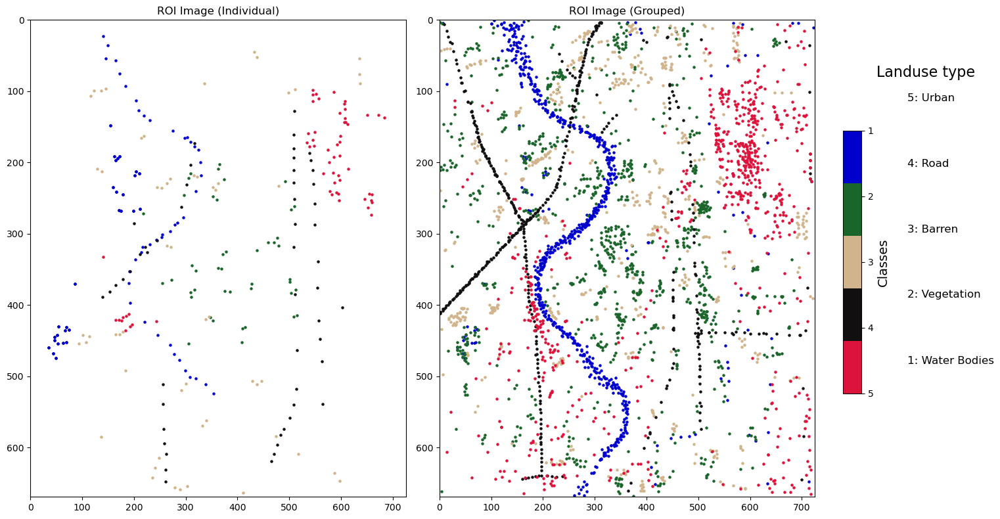

In [10]:
def load_roi_data(file, label, img_shape):
    data = np.loadtxt(file, delimiter=',')
    df = pd.DataFrame(data, columns=['x', 'y'])
    df['class'] = label
    df = df[(df['x'] >= 0) & (df['x'] < img_shape[1]) & (df['y'] >= 0) & (df['y'] < img_shape[0])]
    return df

water_i = load_roi_data('water_bodies.txt', 1, img.shape)
vegetation_i = load_roi_data('vegetation.txt', 2, img.shape)
barren_i = load_roi_data('barren.txt', 3, img.shape)
road_i = load_roi_data('road.txt', 4, img.shape)
urban_i = load_roi_data('urban.txt', 5, img.shape)

roi_df_i = pd.concat([water_i, vegetation_i, barren_i, road_i, urban_i], ignore_index=True)

roi_i = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
for _, row in roi_df_i.iterrows():
    roi_i[int(row['y']), int(row['x'])] = int(row['class'])

def load_group_roi(file, label, img_shape):
    data = np.loadtxt(file, delimiter=',')
    df = pd.DataFrame(data, columns=['x', 'y'])
    df['class'] = label
    df = df[(df['x'] >= 0) & (df['x'] < img_shape[1]) & (df['y'] >= 0) & (df['y'] < img_shape[0])]
    return df

water_g = load_group_roi('roi_combined/water_bodies.txt', 1, img.shape)
vegetation_g = load_group_roi('roi_combined/vegetation.txt', 2, img.shape)
barren_g = load_group_roi('roi_combined/barren.txt', 3, img.shape)
road_g = load_group_roi('roi_combined/road.txt', 4, img.shape)
urban_g = load_group_roi('roi_combined/urban.txt', 5, img.shape)

roi_df_g = pd.concat([water_g, vegetation_g, barren_g, road_g, urban_g], ignore_index=True)

roi_g = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
for _, row in roi_df_g.iterrows():
    roi_g[int(row['y']), int(row['x'])] = int(row['class'])

colors_map = {1:'#0000CD', 2:'#1A652A', 3:'#D2B48C', 4:"#110F0F", 5:'#DC143C'}
colors = [
    '#0000CD',  # 1: Water Bodies
    '#1A652A',  # 2: Vegetation
    '#D2B48C',  # 3: Barren
    "#110F0F",  # 4: Road
    '#DC143C'   # 5: Urban    
]
custom_cmap = ListedColormap(colors)

# Create a figure to control subplots and colorbar placement
fig = plt.figure(figsize=(14, 8))

# Plot individual ROI
ax1 = plt.subplot(121)
for c in roi_df_i['class'].unique():
    subset = roi_df_i[roi_df_i['class']==c]
    ax1.scatter(subset['x'], subset['y'], c=colors_map[c], s=5, label=str(c))
ax1.set_title("ROI Image (Individual)")
ax1.set_xlim(0, img.shape[1])
ax1.set_ylim(0, img.shape[0])
ax1.invert_yaxis()

# Plot grouped ROI
ax2 = plt.subplot(122)
for c in roi_df_g['class'].unique():
    subset = roi_df_g[roi_df_g['class']==c]
    ax2.scatter(subset['x'], subset['y'], c=colors_map[c], s=5, label=str(c))
ax2.set_title("ROI Image (Grouped)")
ax2.set_xlim(0, img.shape[1])
ax2.set_ylim(0, img.shape[0])
ax2.invert_yaxis()

# Add color bar next to the right subplot
cbar_ax = fig.add_axes([0.92, 0.245, 0.02, 0.5])
# Create a dummy image for colorbar using the custom colormap (starting from class 1)
dummy_data = np.array([[1,2,3,4,5]])
dummy_im = cbar_ax.imshow(dummy_data, cmap=custom_cmap, aspect='auto')
dummy_im.set_visible(False)

cbar = fig.colorbar(dummy_im, cax=cbar_ax, ticks=np.arange(1, 6))
cbar.set_label('Classes', fontsize=14)

# Add a title for the legend
cbar.ax.text(4.5, 0, 'Landuse type', fontsize=16, va='top', ha='center')

# Add class labels next to the color bar (only classes 1-5)
class_labels = ['1: Water Bodies','2: Vegetation','3: Barren','4: Road','5: Urban']

cbar.ax.text(3.5, 4.5, class_labels[0], va='center', fontsize=12, ha='left')
cbar.ax.text(3.5, 3.5, class_labels[1], va='center', fontsize=12, ha='left')
cbar.ax.text(3.5, 2.5, class_labels[2], va='center', fontsize=12, ha='left')
cbar.ax.text(3.5, 1.5, class_labels[3], va='center', fontsize=12, ha='left')
cbar.ax.text(3.5, 0.5, class_labels[4], va='center', fontsize=12, ha='left')

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

#### Training the random forest model using individual and combined dataset

In [5]:
def train_and_classify(img, roi_df, n_estimators=500):
    # Create an empty array to store ROI labels, same dimensions as the input image
    roi = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)

    # Assign each land use code to the corresponding pixel in the ROI array
    for index, row in roi_df.iterrows():
        x, y, lu_class = int(row['x']), int(row['y']), int(row['class'])
        roi[y, x] = lu_class
    
    # Prepare training data by selecting pixels with valid labels in the image
    X = img[roi > 0, :]  # Features from the image where ROI is valid
    y = roi[roi > 0]     # Labels from ROI
    
    # Train the Random Forest Classifier
    rf = RandomForestClassifier(n_estimators=n_estimators, oob_score=True, random_state=42)
    rf.fit(X, y)
    
    # Compute the out-of-bag score
    oob_score = rf.oob_score_

    # Predict classes for the entire image
    img_reshaped = img.reshape((-1, img.shape[2]))
    class_prediction = rf.predict(img_reshaped).reshape(img.shape[:2])

    return oob_score, class_prediction, rf, X, y  # Return additional values for visualization

# Define the ROIs to combine for different class combinations
individual_rois = [water_i, vegetation_i, barren_i, road_i, urban_i]
grouped_rois = [water_g, vegetation_g, barren_g, road_g, urban_g]

# Create and evaluate combined ROIs for individual data
print("INDIVIDUAL ROI RESULTS:")
individual_results = {}
for i in range(2, 6):  # Starting from 2 to 5 classes
    combined_roi = pd.concat(individual_rois[:i], ignore_index=True)
    oob_score, class_prediction, rf, X, y = train_and_classify(img, combined_roi)
    individual_results[f'individual_{i}_class'] = (oob_score, class_prediction, rf, X, y)
    print(f"OOB score for individual_{i}_class: {oob_score:.4f}")

# Create and evaluate combined ROIs for grouped data
print("\nGROUPED ROI RESULTS:")
grouped_results = {}
for i in range(2, 6):  # Starting from 2 to 5 classes
    combined_roi = pd.concat(grouped_rois[:i], ignore_index=True)
    oob_score, class_prediction, rf, X, y = train_and_classify(img, combined_roi)
    grouped_results[f'grouped_{i}_class'] = (oob_score, class_prediction, rf, X, y)
    print(f"OOB score for grouped_{i}_class: {oob_score:.4f}")



INDIVIDUAL ROI RESULTS:
OOB score for individual_2_class: 0.9655
OOB score for individual_3_class: 0.9075
OOB score for individual_4_class: 0.6770
OOB score for individual_5_class: 0.7088

GROUPED ROI RESULTS:
OOB score for grouped_2_class: 0.9380
OOB score for grouped_3_class: 0.9111
OOB score for grouped_4_class: 0.8905
OOB score for grouped_5_class: 0.8223


VISUALIZATION - INDIVIDUAL 5-CLASS CLASSIFICATION

Image shape: (669, 725, 8), Reshaped image: (485025, 8)
Prediction shape: (669, 725)


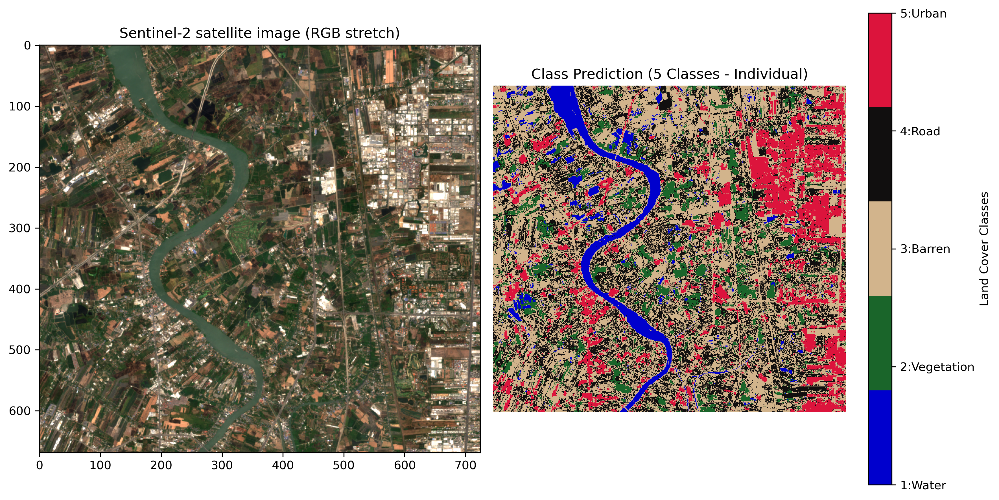

In [13]:
# VISUALIZATION FOR INDIVIDUAL 5-CLASS
print("VISUALIZATION - INDIVIDUAL 5-CLASS CLASSIFICATION")
# Get the individual 5-class results
oob_score, class_prediction, rf, X, y = individual_results['individual_5_class']

# Create a DataFrame for comparing true labels and predictions
df = pd.DataFrame()
df["truth"] = y
df["Predict"] = rf.predict(X)


# Predict over the entire image (already done, but showing details)
new_shape = (img.shape[0] * img.shape[1], img.shape[2]) 
img_as_array = img[:, :, :].reshape(new_shape)   # Using all bands
print(f"\nImage shape: {img.shape}, Reshaped image: {img_as_array.shape}")
print(f"Prediction shape: {class_prediction.shape}")

# Create the visualization
plt.figure(figsize=(12, 6), dpi=300)

# Original image (using bands for RGB visualization)
if img.shape[2] >= 3:
    # Use first three bands for RGB
    rgb_img = img[:, :, :3]
    # Normalize for better visualization
    rgb_img = (rgb_img - rgb_img.min()) / (rgb_img.max() - rgb_img.min())
else:
    # If fewer than 3 bands, use grayscale of first band
    rgb_img = img[:, :, 0]

plt.subplot(121)
vis_rgb = color_stretch(img, [3, 2, 1], (0, 0.3))
plt.imshow(vis_rgb)
plt.title('Sentinel-2 satellite image (RGB stretch)')
plt.savefig("img.png", dpi=180, pad_inches=0, bbox_inches='tight')

# Classified image
plt.subplot(122)
plt.title("Class Prediction (5 Classes - Individual)")
plt.imshow(class_prediction, cmap=custom_cmap, interpolation='none')

# Create colorbar with class labels
cbar = plt.colorbar(ticks=[1, 2, 3, 4, 5])
cbar.set_ticklabels([ '1:Water', '2:Vegetation', '3:Barren', '4:Road', '5:Urban'])
cbar.set_label('Land Cover Classes')

plt.axis('off')
plt.tight_layout()
plt.show()


For individual ROIs, 2 classes produce an OOB score of 0.9655, which captures basic land cover accurately but misses finer details. Increasing to 3 classes lowers the OOB score to 0.9075. With 4 classes, the OOB score drops to 0.6770 because the model struggles to separate similar spectral signatures. Using 5 classes improves slightly to 0.7088 and provides a more detailed map that represents diverse land cover types.

C:\Users\ASUS\AppData\Local\Temp\ipykernel_9480\3262955469.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


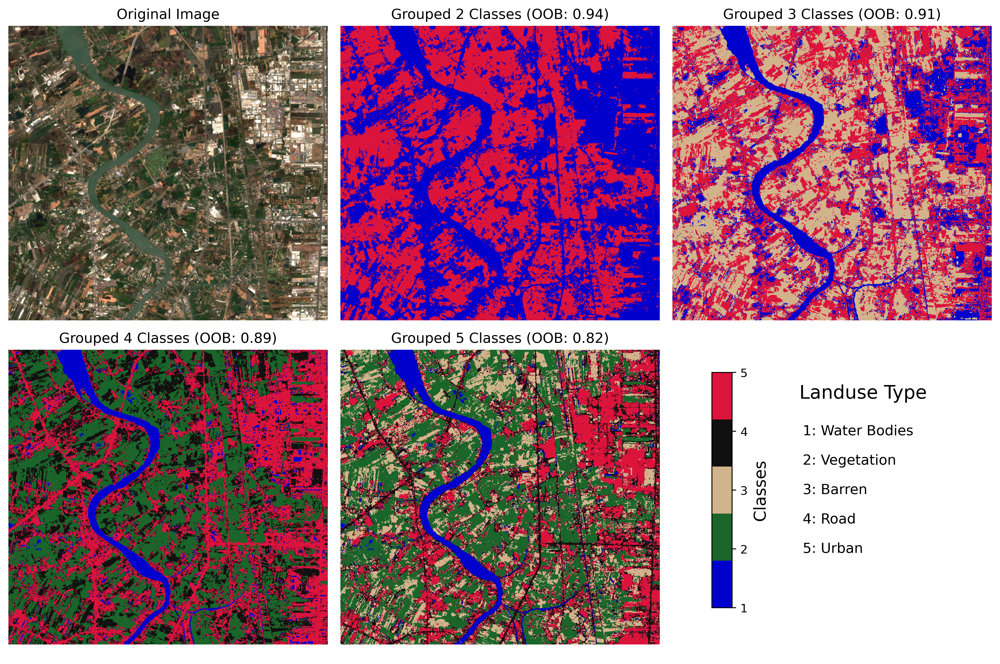

In [19]:
# Create a figure with 2 rows and 3 columns of subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 8), dpi=400)

# Flatten the axes array for easier indexing
ax1, ax2, ax3, ax4, ax5, ax6 = axes.flatten()

# First subplot: Original image
# First subplot: Original image
ax1.imshow(vis_rgb)
ax1.set_title("Original Image")
ax1.axis('off')  # Turn off axis


# Second subplot: Grouped classified image 2 classes
oob_score_2, class_prediction_2 = grouped_results['grouped_2_class'][:2]
img2 = ax2.imshow(class_prediction_2, cmap=custom_cmap, interpolation='none')
ax2.set_title(f"Grouped 2 Classes (OOB: {oob_score_2:.2f})")
ax2.axis('off')

# Third subplot: Grouped classified image 3 classes
oob_score_3, class_prediction_3 = grouped_results['grouped_3_class'][:2]
img3 = ax3.imshow(class_prediction_3, cmap=custom_cmap, interpolation='none')
ax3.set_title(f"Grouped 3 Classes (OOB: {oob_score_3:.2f})")
ax3.axis('off')

# Fourth subplot: Grouped classified image 4 classes
oob_score_4, class_prediction_4 = grouped_results['grouped_4_class'][:2]
img4 = ax4.imshow(class_prediction_4, cmap=custom_cmap, interpolation='none')
ax4.set_title(f"Grouped 4 Classes (OOB: {oob_score_4:.2f})")
ax4.axis('off')

# Fifth subplot: Grouped classified image 5 classes
oob_score_5, class_prediction_5 = grouped_results['grouped_5_class'][:2]
img5 = ax5.imshow(class_prediction_5, cmap=custom_cmap, interpolation='none')
ax5.set_title(f"Grouped 5 Classes (OOB: {oob_score_5:.2f})")
ax5.axis('off')

# Sixth subplot: Leave empty or add information
ax6.axis('off')

# Define custom color bar axis outside the plots
cbar_ax = fig.add_axes([0.71, 0.09, 0.02, 0.35])

# Add color bar to custom axis, using the last classified image
cbar = fig.colorbar(img5, cax=cbar_ax, ticks=np.arange(1, 6))
cbar.set_label('Classes', fontsize=14)

# Add a title for the legend
cbar.ax.text(7.5, 4.8, 'Landuse Type', fontsize=16, va='top', ha='center')

# Add class labels next to the color bar with your class names
class_labels = ['1: Water Bodies', '2: Vegetation', '3: Barren', '4: Road', '5: Urban']

cbar.ax.text(4.5, 4, class_labels[0], va='center', fontsize=12, ha='left')
cbar.ax.text(4.5, 3.5, class_labels[1], va='center', fontsize=12, ha='left')
cbar.ax.text(4.5, 3.0, class_labels[2], va='center', fontsize=12, ha='left')
cbar.ax.text(4.5, 2.5, class_labels[3], va='center', fontsize=12, ha='left')
cbar.ax.text(4.5, 2.0, class_labels[4], va='center', fontsize=12, ha='left')

# Use tight_layout and show the plot
plt.tight_layout()
plt.show()

 For grouped ROIs, 2 classes achieve an OOB score of 0.9380, mapping basic land cover effectively. With 3 classes, the score is 0.9111, and the model begins to distinguish additional land cover types. Four classes reach 0.8905, producing moderate accuracy with more detail. Five classes provide an OOB score of 0.8223, delivering the most informative visualization. Combining all datasets into a single grouped ROI improves model performance and produces clearer, more accurate land use maps. This approach balances accuracy with visualization to support practical land management decisions.

## How do you create the label? How many classes are necessary? Does the number of classes affect your result? Is a higher number of classes better?

### Optimal Number of Classes
The required number of classes depends on the application. For basic land cover mapping, 2 or 3 classes achieve 90 to 96 percent accuracy. For detailed environmental analysis, 4 or 5 classes are necessary to capture landscape complexity.

### Impact of Class Quantity on Results
The number of classes affects classification outcomes. Accuracy drops as class complexity increases. For individual ROI classifications, accuracy declines from 96.55 percent with 2 classes to 70.88 percent with 5 classes. Each additional class introduces more chances for misclassification and requires distinguishing similar spectral classes.

### Evaluation of Higher Class Numbers
Higher class numbers do not guarantee better accuracy. Out-of-bag scores decrease as classes increase. From a practical perspective, more classes provide better visualization and ecological relevance. Five-class models deliver more detailed land cover maps, representing real-world landscape diversity. Quantitative accuracy decreases with more classes, but the maps offer higher practical value if accuracy remains acceptable.


### Your process of using random forests to classify land cover/ land use. Is it necessary to include all 8 bands?
Using Random Forests for land cover and land use classification with Sentinel-2 imagery does not require all eight bands, but including them can improve results. The Red, Green, and Blue bands provide basic spectral data. Additional bands such as Near-Infrared and Red Edge reveal information about vegetation health, soil moisture, and other land cover types not visible in RGB. More bands give the model additional features, which can improve classification accuracy. Using all bands increases the risk of overfitting if your training data is small, because irrelevant or noisy data may be included. Applying feature selection or dimensionality reduction methods like PCA helps keep the most informative bands while reducing data size. In this study, only the Red, Green, and Blue bands were used.

### Conclusion
The analysis showed that increasing the number of classes improves the match with actual Sentinel-2 based land use patterns. Higher class numbers increase model complexity and reduce some performance metrics. For this study, five classes—Water-bodies, Vegetation, Barren, Urban, and Road were used. Using all eight Sentinel-2 bands is not required, but classification can improve by including additional bands. Combining ROIs did not significantly change classification accuracy. Both individual and combined ROI approaches have advantages and limitations.Overall, the study confirms that Random Forest is an effective machine learning method for land use classification.